# Part 2: Kernel Density Estimation

In [1]:
import cv2
import numpy                as np
import pandas               as pd
import matplotlib.pyplot    as plt

from scipy.optimize import minimize

## Part 2.2: Task-1

In [2]:
class KDE():
    def __init__(self, kernel_type='gaussian'):
        self.kernel_type    = kernel_type
        self.bandwidth      = None
        self.X              = None

    def __kernel_function(self, X):
        if self.kernel_type == 'box':
            return np.where(np.abs(X) <= 1, 0.5, 0)
        elif self.kernel_type == 'gaussian':
            return 1 / (np.sqrt(2 * np.pi)) * np.exp(-0.5 * X**2)
        elif self.kernel_type == 'triangular':
            return np.where(np.abs(X) <= 1, 1 - np.abs(X), 0)

    def __pseudo_likelihood(self, bandwidth):
        diffs               = self.X - self.X[:, None]

        # ChatGPT prompt to get the below line:
        """
        I have an n x n x d numpy array. I want to extract the non-diagonal elements and this diagonal is along the first two dimensions.
        So, finally I am expecting to get a n x (n - 1) x d numpy array.
        Do this with numpy indexing and numpy functions and "DO NOT" use for loops or list comprehensions or lambdas
        """

        non_zero_diff_mask  = ~np.eye(self.X.shape[0], dtype=bool)
        non_zero_diffs      = diffs[non_zero_diff_mask, :].reshape(self.X.shape[0], self.X.shape[0] - 1, self.X.shape[1])

        kernel_output       = self.__kernel_function(non_zero_diffs / bandwidth)

        p_n_x_n             = np.mean(np.sum(kernel_output, axis=1), axis=1) / bandwidth

        pseudo_likelihood   = np.mean(np.log(p_n_x_n, where=p_n_x_n > 0))

        return -pseudo_likelihood

    def __get_bandwidth(self):
        initial_bandwidth   = np.std(self.X) * (4 / (3 * self.X.shape[0]))**0.2
        optimization_result = minimize(self.__pseudo_likelihood, initial_bandwidth, bounds=((1e-5, None),))
        optimial_bandwidth  = optimization_result.x[0]

        return optimial_bandwidth

    def fit(self, X):
        self.X          = X[..., None] if X.ndim == 1 else X
        self.bandwidth  = self.__get_bandwidth()

    def get_density(self, X):
        X               = X.reshape(-1, self.X.shape[1])
        diffs           = X[:, None] - self.X
        kernel_output   = self.__kernel_function(diffs / self.bandwidth)

        density         = np.sum(np.sum(kernel_output, axis=1), axis=1) / (self.X.shape[0] * self.bandwidth)

        return density

    def plot_pdf(self, X, ax=None, fig=None):
        if X.ndim == 1:
            X       = X.reshape(-1, self.X.shape[1])
            density = self.get_density(X)

            if ax is None:
                plt.hist(self.X, bins=50, density=True, color='orange', ec='black')
                plt.plot(X, density, color='green', lw=3)
                plt.title(f'KDE Plot of 1D Data with {self.kernel_type} Kernel and Bandwidth {np.round(self.bandwidth, 3)}')
                plt.show()
            else:
                ax.hist(self.X, bins=50, density=True, color='orange', ec='black')
                ax.plot(X, density, color='green', lw=3)
                ax.set_title(f'KDE Plot of 1D Data with {self.kernel_type} Kernel and Bandwidth {np.round(self.bandwidth, 3)}')

        elif X.ndim == 2:
            x_min, x_max = X[:, 0].min(), X[:, 0].max()
            y_min, y_max = X[:, 1].min(), X[:, 1].max()
            xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
            positions = np.vstack([xx.ravel(), yy.ravel()])
            
            densities = np.reshape(self.get_density(positions.T), xx.shape)

            if ax is None:
                plt.contourf(xx, yy, densities, cmap='Greens', levels=50, alpha=0.7)
                plt.scatter(self.X[:, 0], self.X[:, 1], color='orange', alpha=0.5)
                plt.xlim(x_min, x_max)
                plt.ylim(y_min, y_max)
                plt.title(f'KDE Plot of 2D Data with {self.kernel_type} Kernel and Bandwidth {np.round(self.bandwidth, 3)}')
                plt.colorbar()
                plt.show()
            else:
                contour = ax.contourf(xx, yy, densities, cmap='Greens', levels=50, alpha=0.7)
                ax.scatter(self.X[:, 0], self.X[:, 1], color='orange', alpha=0.5)
                ax.set_xlim(x_min, x_max)
                ax.set_ylim(y_min, y_max)
                ax.set_title(f'KDE Plot of 2D Data with {self.kernel_type} Kernel and Bandwidth {np.round(self.bandwidth, 3)}')
                fig.colorbar(contour, ax=ax)

        # ChatGPT prompt to get the above code for 2D data plotting:
        """
        I have the following class for a Kernel Density Estimator.
        Help me write code for the case of visualizing the pdf of the distribution in the 2D case. The class is as follows:
        ```Code of the class```
        """

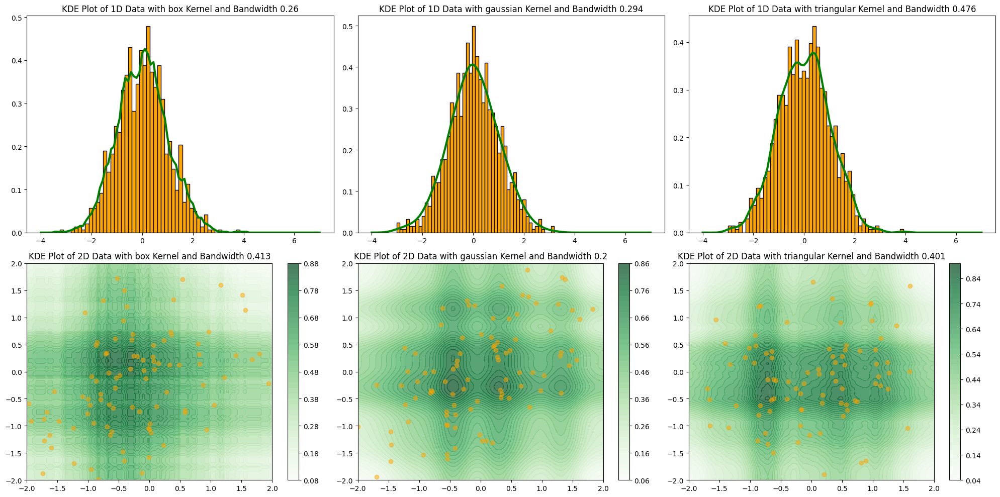

In [3]:
np.random.seed(42)

kernels  = ['box', 'gaussian', 'triangular']
fig, axs = plt.subplots(2, 3, figsize=(20, 10))

for i, kernel in enumerate(kernels):
    normal_1d = np.random.normal(loc=0, scale=1, size=1000)
    kde       = KDE(kernel_type=kernel)
    kde.fit(normal_1d)
    
    test_data_1d = np.linspace(-4, 7, 100)
    kde.plot_pdf(test_data_1d, ax=axs[0, i], fig=fig)

    normal_2d = np.random.multivariate_normal(mean=[0, 0], cov=[[1, 0.5], [0.5, 1]], size=100)
    kde       = KDE(kernel_type=kernel)
    kde.fit(normal_2d)

    x_2d = np.linspace(-2, 2, 100)
    y_2d = np.linspace(-2, 2, 100)
    X_2d, Y_2d = np.meshgrid(x_2d, y_2d)

    test_data_2d    = np.vstack([X_2d.ravel(), Y_2d.ravel()]).T
    kde.plot_pdf(test_data_2d, ax=axs[1, i], fig=fig)

fig.tight_layout()

## Part 2.3: Task-2

In [ ]:
def create_df(img_num):
    df = pd.read_csv(f"./Data/KDE/CSV/TLBR_{img_num}.csv")
    df = df.drop(columns=['Unnamed: 0'])

    df_columns = df.columns.tolist()
    reordered_df_columns = df_columns[-1:] + df_columns[:-1]

    new_columns = ['Top', 'Left', 'Bottom', 'Right', 'Center', 'Top_Box', 'Left_Box', 'Bottom_Box', 'Right_Box']
    euclidean = pd.DataFrame(columns = reordered_df_columns + new_columns)

    for i, data in df.iterrows():
        left, top = data['Top-Left'].split(", ")
        right, bottom = data['Bottom-Right'].split(", ")
        
        left    =  int(left[1:])
        right   =  int(right[1:])
        top     =  int(top[:-1])
        bottom  =  int(bottom[:-1])

        top_left      = np.array([left, top])
        bottom_right  = np.array([right, bottom])
        top_coords    = np.array([(left + right) // 2, top])
        left_coords   = np.array([left, (top + bottom) // 2])
        bottom_coords = np.array([(left + right) // 2, bottom])
        right_coords  = np.array([right, (top + bottom) // 2])

        top_box = bottom_box = left_box = right_box = np.array([-1, 0])

        center  = np.array([(left + right) // 2, (top + bottom) // 2])

        new_data = [data['Id'], top_left, bottom_right, top_coords, left_coords, bottom_coords, right_coords, center, top_box, left_box, bottom_box, right_box]
        euclidean.loc[i] = new_data

    return euclidean

In [ ]:
def get_hdists(df):
    hdists = []
    for _, data in df.iterrows():
        neighbour_dists = []

        for _, data_2 in df.iterrows():
            c1 = data['Center']
            c2 = data_2['Center']

            dist = np.linalg.norm(c1 - c2)
            neighbour_dists.append(dist)

        closest_neighbours = np.argsort(neighbour_dists)[1:7]

        for neighbour in closest_neighbours:
            hdist = np.min(np.abs([data['Left'][0] - df.loc[neighbour]['Right'][0], data['Right'][0] - df.loc[neighbour]['Left'][0], 
                                   data['Left'][0] - df.loc[neighbour]['Left'][0], data['Right'][0] - df.loc[neighbour]['Right'][0]]))
            hdists.append(hdist)

    return np.array(hdists)

def get_vdists(df):
    vdists = []
    for _, data in df.iterrows():
        neighbour_dists = []

        for _, data_2 in df.iterrows():
            c1 = data['Center']
            c2 = data_2['Center']

            dist = np.linalg.norm(c1 - c2)
            neighbour_dists.append(dist)    

        closest_neighbours = np.argsort(neighbour_dists)[1:7]

        for neighbour in closest_neighbours:
            vdist = np.min(np.abs([data['Top'][1] - df.loc[neighbour]['Bottom'][1], data['Bottom'][1] - df.loc[neighbour]['Top'][1], 
                                   data['Top'][1] - df.loc[neighbour]['Top'][1], data['Bottom'][1] - df.loc[neighbour]['Bottom'][1]]))
            vdists.append(vdist)

    return np.array(vdists)

In [ ]:
def plot_results(img_num, kernel_type='box', bandwidth=None):
    result_df = create_df(img_num)
    result_img = cv2.cvtColor(cv2.imread(f"./Data/KDE/images/{img_num}.jpg"), cv2.COLOR_BGR2RGB)
    
    hkde = KDE(kernel_type=kernel_type)
    hdists = get_hdists(result_df)
    hkde.fit(hdists)
    h_threshold = np.percentile(hdists, 90)
    print(f"Horizontal threshold: {h_threshold}")
    print(f"Computed horizontal bandwidth: {hkde.bandwidth}")
    if bandwidth is not None:
        hkde.bandwidth = bandwidth
        print(f"Bandwidth hyperparameter value: {bandwidth}")
    print()

    vkde = KDE(kernel_type=kernel_type)
    vdists = get_vdists(result_df)
    vkde.fit(vdists)
    v_threshold = np.percentile(vdists, 40)
    print(f"Vertical threshold: {v_threshold}")
    print(f"Computed vertical bandwidth: {vkde.bandwidth}")
    if bandwidth is not None:
        vkde.bandwidth = bandwidth
        print(f"Bandwidth hyperparameter value: {bandwidth}")
    print()

    for i, data in result_df.iterrows():
        cv2.rectangle(result_img, data['Top-Left'], data['Bottom-Right'], (255, 0, 0), 2)

        for j, data_2 in result_df.iterrows():
            if i != j:
                h_dist = np.min(np.abs([data['Left'][0] - data_2['Right'][0], data['Right'][0] - data_2['Left'][0], 
                                        data['Left'][0] - data_2['Left'][0], data['Right'][0] - data_2['Right'][0]]))
                v_dist = np.min(np.abs([data['Top'][1] - data_2['Bottom'][1], data['Bottom'][1] - data_2['Top'][1], 
                                        data['Top'][1] - data_2['Top'][1], data['Bottom'][1] - data_2['Bottom'][1]]))

                if h_dist <= h_threshold and v_dist <= v_threshold:
                    cv2.line(result_img, data['Center'], data_2['Center'], (0, 255, 0), 2)

    _, axs = plt.subplots(1, 3, figsize=(21, 7))

    test_dists = np.linspace(min(hdists), max(hdists), 1000)
    test_densities = hkde.get_density(test_dists)
    axs[0].plot(test_dists, test_densities)
    axs[0].axvline(h_threshold, color='red', ls='--', label='Horizontal threshold')
    axs[0].set_title(f'Horizontal density - {kernel_type} kernel - {np.round(hkde.bandwidth, 3) if bandwidth is None else np.round(bandwidth, 3)} bandwidth')
    axs[0].legend()

    test_dists = np.linspace(min(vdists), max(vdists), 1000)
    test_densities = vkde.get_density(test_dists)
    axs[1].plot(test_dists, test_densities)
    axs[1].axvline(v_threshold, color='red', ls='--', label='Vertical threshold')
    axs[1].set_title(f'Vertical density - {kernel_type} kernel - {np.round(vkde.bandwidth, 3) if bandwidth is None else np.round(bandwidth, 3)} bandwidth')
    axs[1].legend()

    axs[2].imshow(result_img)
    axs[2].axis('off')
    axs[2].set_title('Resulting document structure')

    plt.show()

Kernel: box - Bandwidth: 10
Horizontal threshold: 51.0
Computed horizontal bandwidth: 5.000067096161558
Bandwidth hyperparameter value: 10

Vertical threshold: 10.0
Computed vertical bandwidth: 7.000020715850786
Bandwidth hyperparameter value: 10



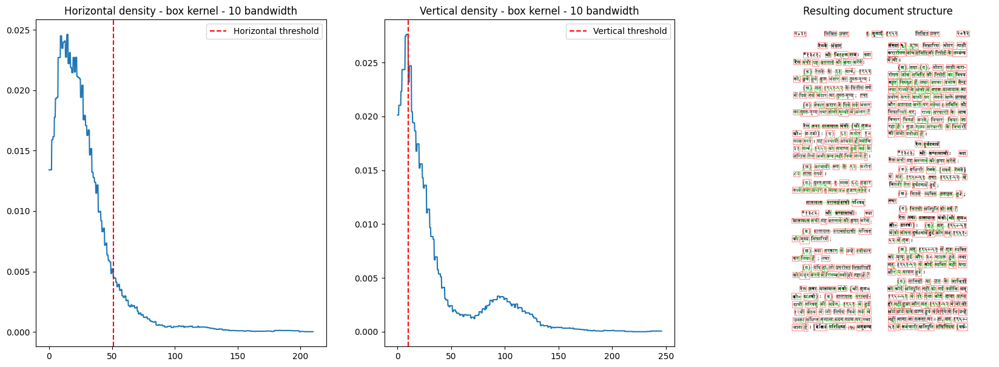

Kernel: box - Bandwidth: 15
Horizontal threshold: 82.0
Computed horizontal bandwidth: 7.000181824195988
Bandwidth hyperparameter value: 15

Vertical threshold: 17.0
Computed vertical bandwidth: 1e-05
Bandwidth hyperparameter value: 15



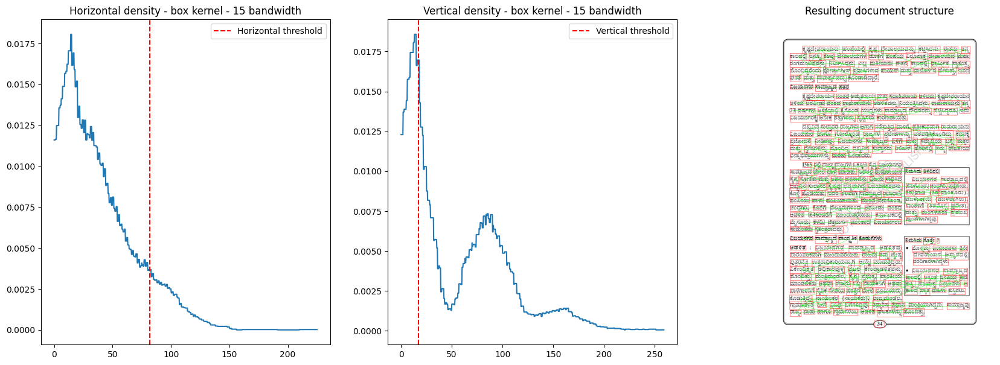

Kernel: gaussian - Bandwidth: 10
Horizontal threshold: 49.0
Computed horizontal bandwidth: 3.596792586923774
Bandwidth hyperparameter value: 10

Vertical threshold: 6.0
Computed vertical bandwidth: 6.00040278853824
Bandwidth hyperparameter value: 10



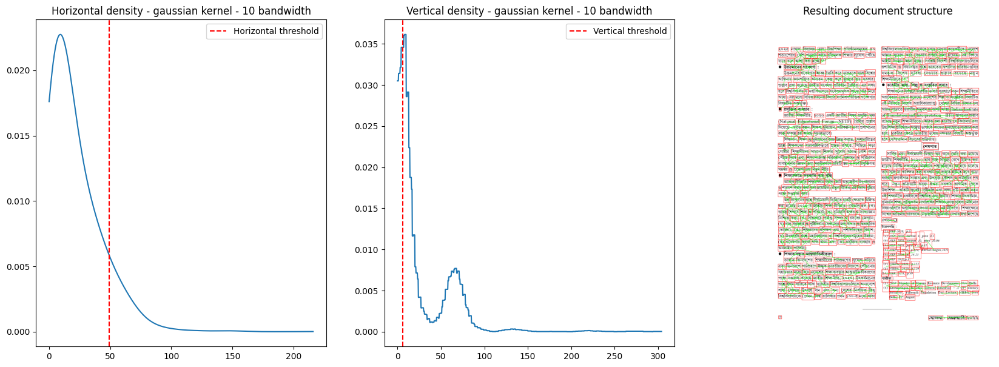

Kernel: gaussian - Bandwidth: 15
Horizontal threshold: 45.30000000000018
Computed horizontal bandwidth: 1e-05
Bandwidth hyperparameter value: 15

Vertical threshold: 7.0
Computed vertical bandwidth: 3.0019111277334063
Bandwidth hyperparameter value: 15



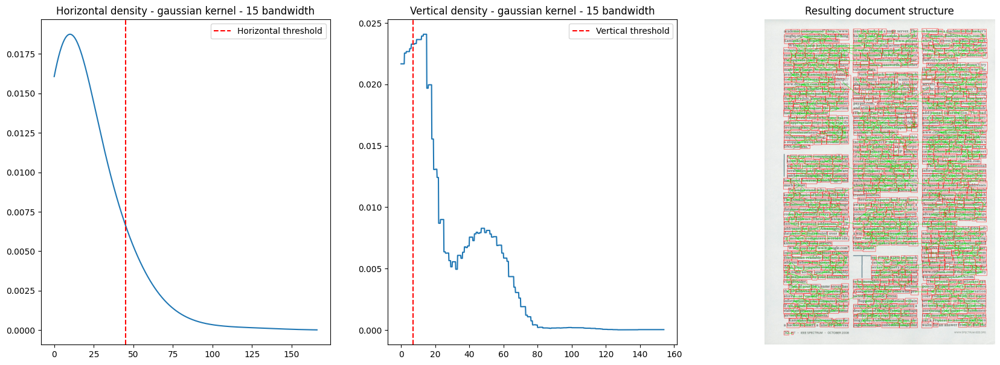

Kernel: triangular - Bandwidth: 10
Horizontal threshold: 51.0
Computed horizontal bandwidth: 5.631749358647801
Bandwidth hyperparameter value: 10

Vertical threshold: 10.0
Computed vertical bandwidth: 7.000020715850786
Bandwidth hyperparameter value: 10



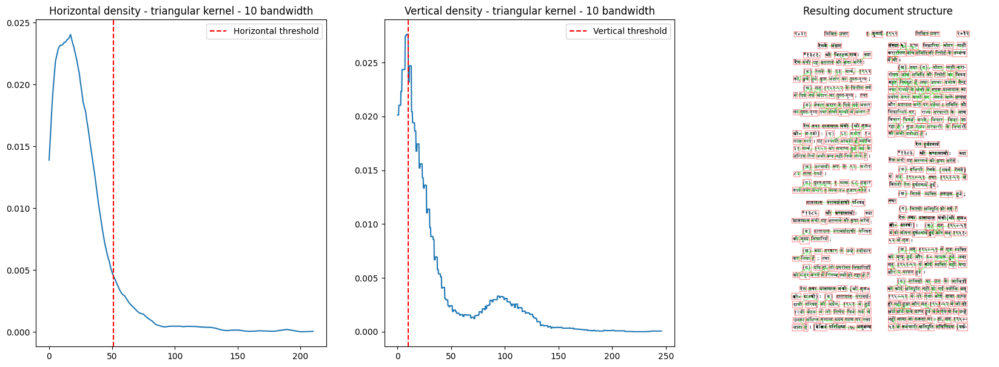

Kernel: triangular - Bandwidth: 15
Horizontal threshold: 82.0
Computed horizontal bandwidth: 7.40485590086466
Bandwidth hyperparameter value: 15

Vertical threshold: 17.0
Computed vertical bandwidth: 1e-05
Bandwidth hyperparameter value: 15



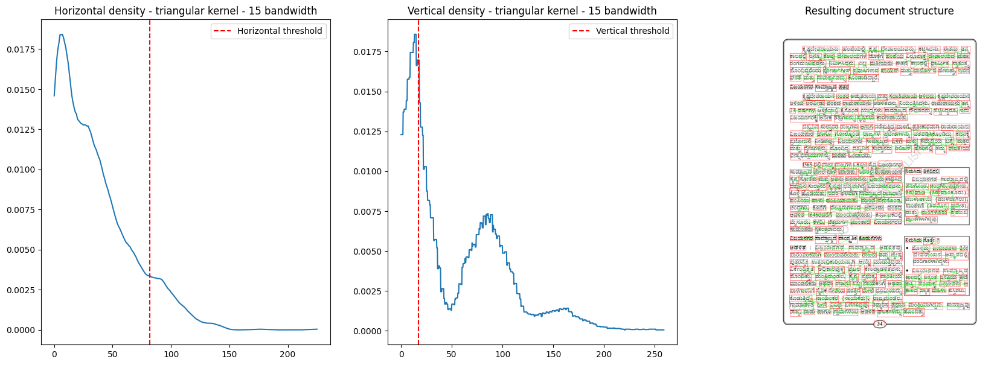

In [ ]:
hyperparam_imgs = [29, 145, 174, 250]
bandwidths = [10, 15]
kernels = ['box', 'gaussian', 'triangular']

for i, kernel in enumerate(kernels):
    for j, bandwidth in enumerate(bandwidths):
        print("===============================================")
        print(f"Kernel: {kernel} - Bandwidth: {bandwidth}")
        print("===============================================")
        plot_results(hyperparam_imgs[(i * 2 + j) % 4], kernel_type=kernel, bandwidth=bandwidth)

In [ ]:
def make_connections(image, df):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_with_boxes = image_rgb.copy()

    for _, row in df.iterrows():
        left = int(row['Left'][0])
        right = int(row['Right'][0])
        top = int(row['Top'][1])
        bottom = int(row['Bottom'][1])
        box_id = int(row['Id'])

        width = right - left
        height = bottom - top

        top_left = (left, top)
        bottom_right = (right, bottom)

        cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

        label_position = (left, top - 10)
        cv2.putText(image_with_boxes, str(box_id), label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

        top_adjacent_id = int(row['Top_Box'][1])
        bottom_adjacent_id = int(row['Bottom_Box'][1])
        left_adjacent_id = int(row['Left_Box'][1])
        right_adjacent_id = int(row['Right_Box'][1])

        if top_adjacent_id != 0:
            top_adjacent_row = df[df['Id'] == top_adjacent_id].iloc[0]
            top_adjacent_center = int(top_adjacent_row['Bottom'][0]) , int(top_adjacent_row['Bottom'][1])
            cv2.line(image_with_boxes, (int(left) + width // 2, int(top)), top_adjacent_center, (0, 255, 0), 2)

        if bottom_adjacent_id != 0:
            bottom_adjacent_row = df[df['Id'] == bottom_adjacent_id].iloc[0]
            bottom_adjacent_center = int(bottom_adjacent_row['Top'][0]) , int(bottom_adjacent_row['Top'][1])
            cv2.line(image_with_boxes, (int(left) + width // 2, int(bottom)), (int(bottom_adjacent_center[0]), int(bottom_adjacent_center[1])), (0, 255, 0), 2)

        if left_adjacent_id != 0:
            left_adjacent_row = df[df['Id'] == left_adjacent_id].iloc[0]
            left_adjacent_center = int(left_adjacent_row['Right'][0]) , int(left_adjacent_row['Right'][1])
            cv2.line(image_with_boxes, (int(left), int(top) + height // 2), (int(left_adjacent_center[0]), int(left_adjacent_center[1])), (0, 255, 0), 2)

        if right_adjacent_id != 0:
            right_adjacent_row = df[df['Id'] == right_adjacent_id].iloc[0]
            right_adjacent_center = int(right_adjacent_row['Left'][0]) , int(right_adjacent_row['Left'][1])
            cv2.line(image_with_boxes, (int(right), int(top) + height // 2), (int(right_adjacent_center[0]), int(right_adjacent_center[1])), (0, 255, 0), 2)

    return image_with_boxes

In [ ]:
def set_neighbour(df):
    for i, data in df.iterrows():
        left_dists = []
        right_dists = []
        top_dists = []
        bot_dists = []

        for j, data_2 in df.iterrows():
            if i != j:
                left_dist  = np.abs(data['Left'][0] - data_2['Right'][0])
                right_dist = np.abs(data['Right'][0] - data_2['Left'][0])
                top_dist   = np.abs(data['Top'][1] - data_2['Bottom'][1])
                bot_dist   = np.abs(data['Bottom'][1] - data_2['Top'][1])

                left_dists.append([left_dist, data_2['Id']])
                right_dists.append([right_dist, data_2['Id']])
                top_dists.append([top_dist, data_2['Id']])
                bot_dists.append([bot_dist, data_2['Id']])

        left_dists  = np.array(left_dists)
        right_dists = np.array(right_dists)
        top_dists   = np.array(top_dists)
        bot_dists   = np.array(bot_dists)

        left_dists  = left_dists[left_dists[:, 0].argsort()]
        right_dists = right_dists[right_dists[:, 0].argsort()]
        top_dists   = top_dists[top_dists[:, 0].argsort()]
        bot_dists   = bot_dists[bot_dists[:, 0].argsort()]

        if df.loc[i]['Left_Box'][0]   == -1 or left_dists[0][0]  < df.loc[i]['Left_Box'][0]:
            df.at[i, 'Left_Box']   = [left_dists[0][0], left_dists[0][1]]
        if df.loc[i]['Right_Box'][0]  == -1 or right_dists[0][0] < df.loc[i]['Right_Box'][0]:
            df.at[i, 'Right_Box']  = [right_dists[0][0], right_dists[0][1]]
        if df.loc[i]['Top_Box'][0]    == -1 or top_dists[0][0]   < df.loc[i]['Top_Box'][0]:
            df.at[i, 'Top_Box']    = [top_dists[0][0], top_dists[0][1]]
        if df.loc[i]['Bottom_Box'][0] == -1 or bot_dists[0][0]   < df.loc[i]['Bottom_Box'][0]:
            df.at[i, 'Bottom_Box'] = [bot_dists[0][0], bot_dists[0][1]]

    return df

In [ ]:
from scipy.cluster.hierarchy import linkage, fcluster

def plot_comparision(img_num):
    result_df = create_df(img_num)
    result_img = cv2.cvtColor(cv2.imread(f"./Data/KDE/images/{img_num}.jpg"), cv2.COLOR_BGR2RGB)

    hkde = KDE(kernel_type='box')
    hdists = get_hdists(result_df)
    hkde.fit(hdists)
    hkde.bandwidth = 10
    h_threshold = np.percentile(hdists, 90)

    vkde = KDE(kernel_type='box')
    vdists = get_vdists(result_df)
    vkde.fit(vdists)
    vkde.bandwidth = 15
    v_threshold = np.percentile(vdists, 40)

    for i, data in result_df.iterrows():
        cv2.rectangle(result_img, data['Top-Left'], data['Bottom-Right'], (255, 0, 0), 2)

        for j, data_2 in result_df.iterrows():
            if i != j:
                h_dist = np.min(np.abs([data['Left'][0] - data_2['Right'][0], data['Right'][0] - data_2['Left'][0], 
                                        data['Left'][0] - data_2['Left'][0], data['Right'][0] - data_2['Right'][0]]))
                v_dist = np.min(np.abs([data['Top'][1] - data_2['Bottom'][1], data['Bottom'][1] - data_2['Top'][1], 
                                        data['Top'][1] - data_2['Top'][1], data['Bottom'][1] - data_2['Bottom'][1]]))

                if h_dist <= h_threshold and v_dist <= v_threshold:
                    cv2.line(result_img, data['Center'], data_2['Center'], (0, 255, 0), 2)

    _, axs = plt.subplots(1, 2, figsize=(16, 9))

    axs[0].imshow(result_img)
    axs[0].axis('off')
    axs[0].set_title('KDE Output')

    result_img_4_2 = cv2.cvtColor(cv2.imread(f"./Data/KDE/images/{img_num}.jpg"), cv2.COLOR_BGR2RGB)
    result_df_4_2 = create_df(img_num)
    result_df_4_2 = set_neighbour(result_df_4_2)

    linkage_matrix = linkage(result_df_4_2['Center'].to_list(), optimal_ordering=True, method='single')
    cluster_labels = fcluster(linkage_matrix, t=13, criterion='maxclust')

    indices = np.arange(len(result_df_4_2))
    nearest_box_types = ['Top_Box', 'Left_Box', 'Bottom_Box', 'Right_Box']

    for i in range(15):
        points = indices[cluster_labels == i + 1]

        for j in points:
            for box_type in nearest_box_types:
                nearest_box_id = result_df_4_2.loc[j][box_type][1]

                if nearest_box_id not in points:
                    result_df_4_2.at[j, box_type] = [-1, 0]

    result_img_4_2 = make_connections(result_img_4_2, result_df_4_2)

    axs[1].imshow(result_img_4_2)
    axs[1].axis('off')
    axs[1].set_title('Problem 4.2 Output')

    plt.show()

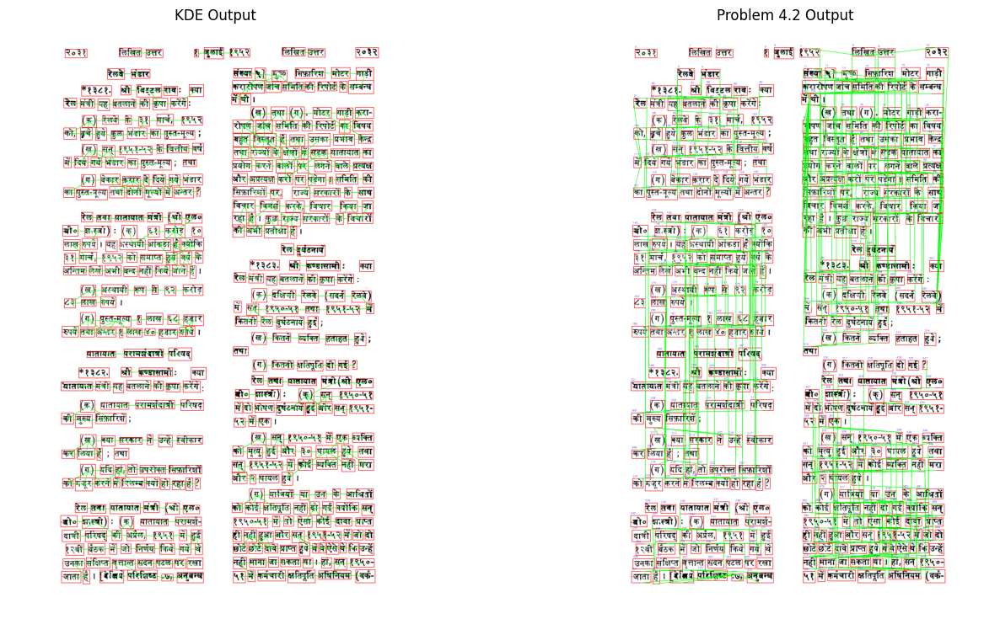

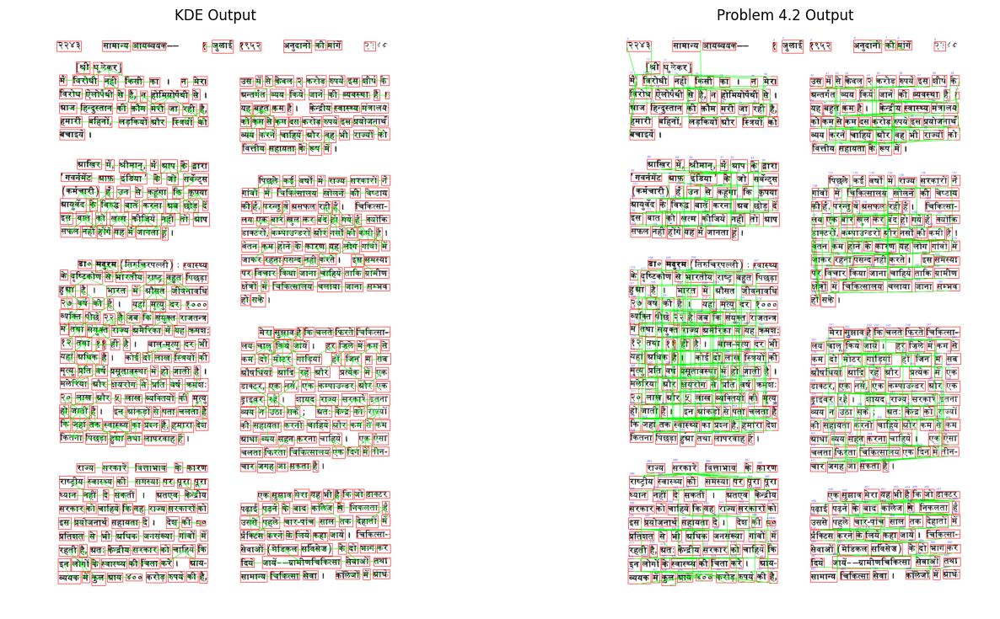

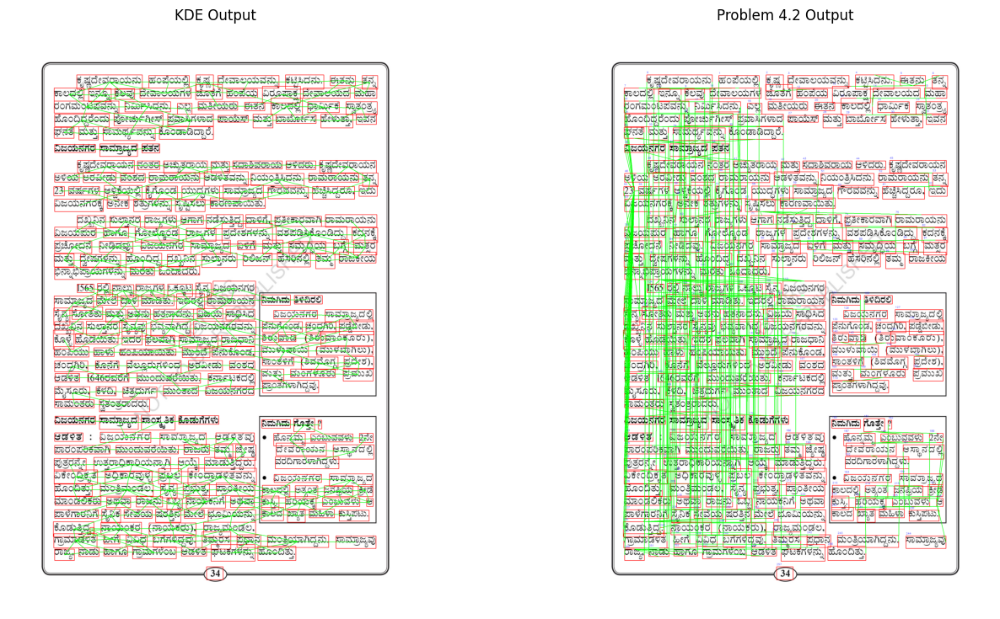

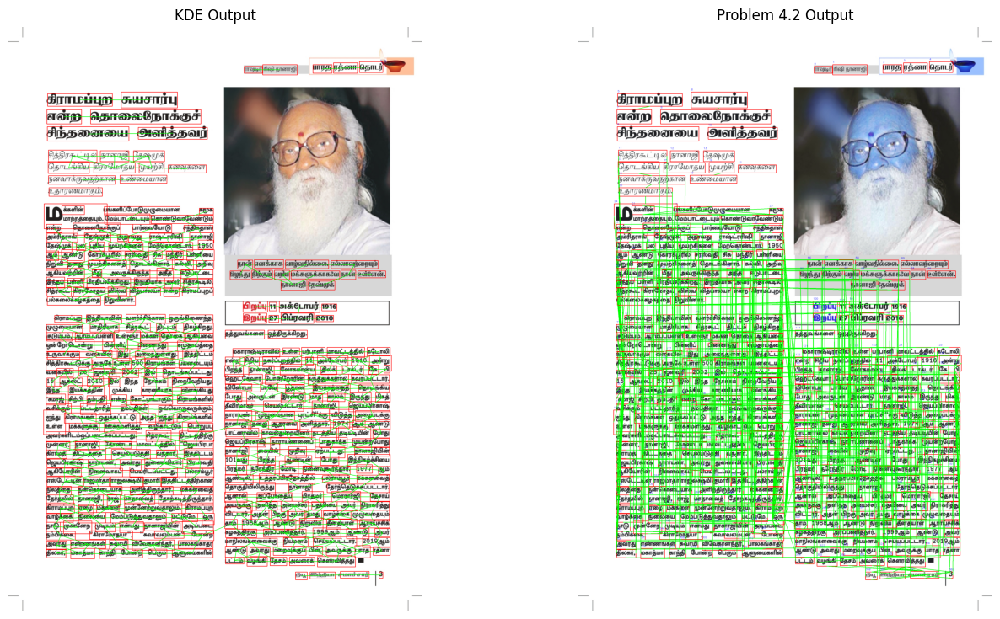

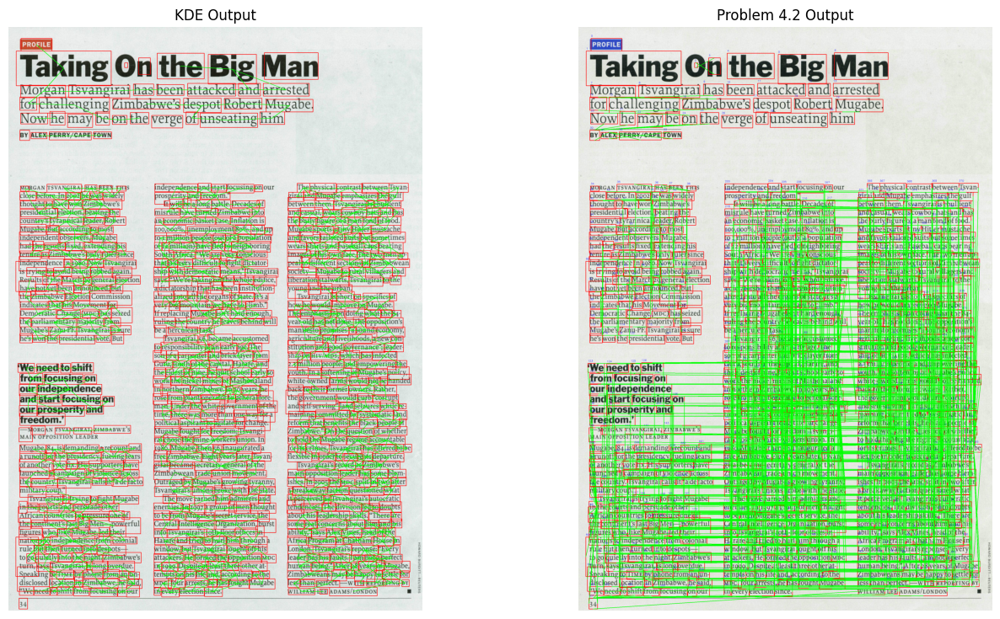

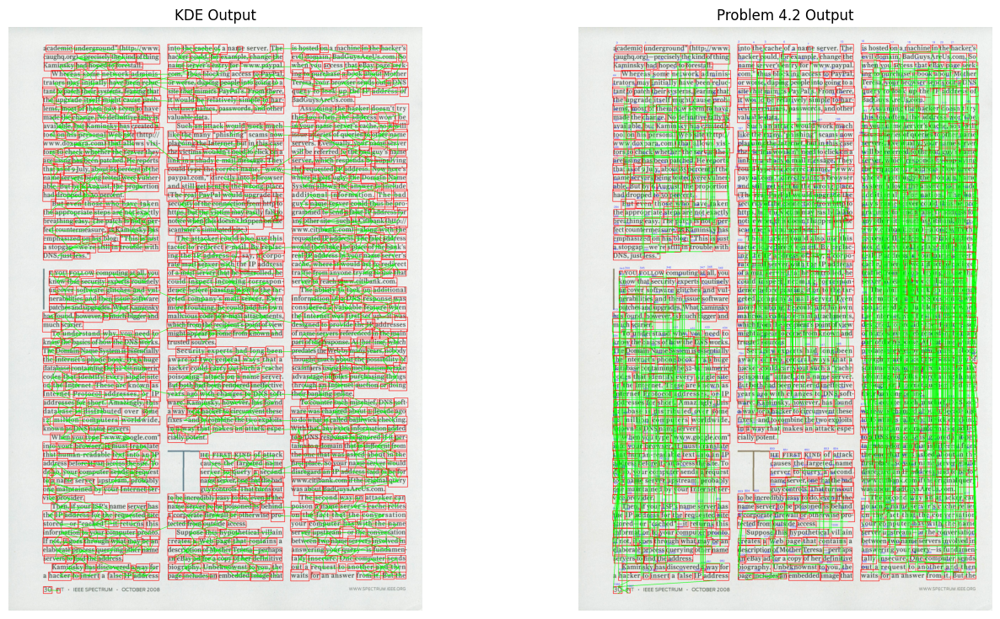

In [ ]:
test_imgs = [29, 68, 145, 201, 232, 250]

for img_num in test_imgs:
    plot_comparision(img_num)